# VisionAgent Tutorial - Multi object detection


## Table of Contents
1. [Create a Coding Agent](#create-a-coding-agent)
2. [Generate Code](#generate-code)
3. [Test Generated Code](#test-generated-code)

In this Jupyter notebook, we guide you through the comprehensive process of using VisionAgent to generate code that detects the given categories from an image and creates bounding boxes. Each section is crafted to provide you with a conceptual understanding of the step in the process and practical code examples. 

In [1]:
# Install VisionAgent
!pip install vision-agent

  Using cached vision_agent-0.2.238-py3-none-any.whl (1.3 MB)
  Using cached numpy-1.26.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.2 MB)
  Using cached pandas-2.2.3-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.1 MB)
  Using cached anthropic-0.31.2-py3-none-any.whl (865 kB)
  Using cached pillow_heif-0.16.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (7.5 MB)
  Using cached tabulate-0.9.0-py3-none-any.whl (35 kB)
  Using cached pillow-10.4.0-cp310-cp310-manylinux_2_28_x86_64.whl (4.5 MB)
  Using cached pydantic_settings-2.7.1-py3-none-any.whl (29 kB)
  Using cached e2b-0.17.2a62-py3-none-any.whl (79 kB)
  Using cached openai-1.61.1-py3-none-any.whl (463 kB)
  Using cached opencv_python-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (63.0 MB)
  Using cached opentelemetry_api-1.30.0-py3-none-any.whl (64 kB)
  Using cached pydantic-2.7.4-py3-none-any.whl (409 kB)
  Using cached tqdm-4.67.1-py3-none-any.whl (78 kB)
 

## Prerequisite

In order to run below example, you will need to provide an Anthropic API key from your Anthropic account. Supply your key in below cell. We will set it as an environment variable so VisionAgent can load it later.

In [2]:
from dotenv import load_dotenv
load_dotenv()

True

In [3]:
import os
# TODO: fill below with your API key
# os.environ["ANTHROPIC_API_KEY"] = "YOUR_ANTHROPIC_API_KEY"
# os.environ["OPENAI_API_KEY"] = "YOUR_OPENAI_API_KEY"
# print(os.environ["ANTHROPIC_API_KEY"])

## Create a Coding Agent Instance

In order to generate code, we need to first create a coding agent instance.

In [3]:
from vision_agent.agent.vision_agent_coder_v2 import VisionAgentCoderV2
from vision_agent.models import AgentMessage

# set verbose to True so we can see logs of the code generation process.
agent = VisionAgentCoderV2(verbose=True)

## Generate Code

To generate code, you need to provide two inputs to the agent:

1. An input image
2. A prompt string that describes your vision task.

Let's first prepare the input image.

### Step 1 - Prepare an input image

We have prepared an input image in a http url format. Let's download it to disk, and name it `"soda_cans.png"`.

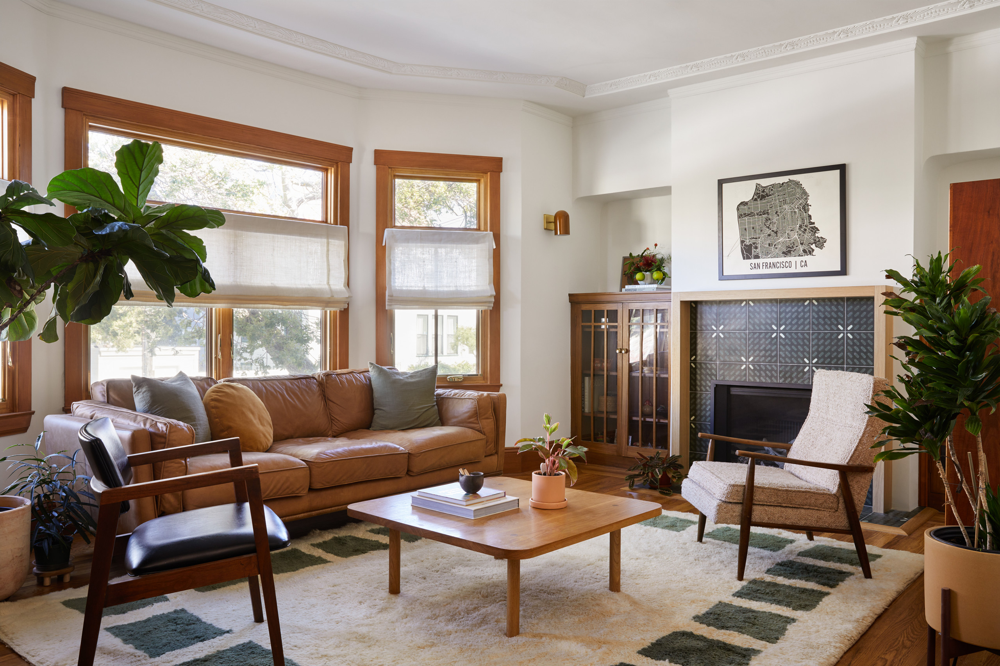

In [6]:
from vision_agent.tools import load_image
import PIL.Image

input_image_url = "https://st.hzcdn.com/simgs/97910d6b0407c3d1_14-0485/_.jpg"

img_np = load_image(input_image_url)
img_pil = PIL.Image.fromarray(img_np)
image_path = "living_room.png"
img_pil.save(image_path)

# Let's see the image
img_pil

### Step 2 - Write a prompt

Now we need to write a prompt that describes the vision task that we want VisionAgent to generate code for.

Below is the prompt we wrote for this task.

In [7]:
user_prompt = """
Write a program that detects sofa, armchair and coffee table in an image.
The program should print the bounding box locations for each detected category,
draw bounding boxes around each detected category,
and display the confidence score for each prediction."""

### Code Generation Process

What happens under the hood is that the agent will generate a plan for the code generation task, and then generate code and test case based on the plan. Then the agent will test the generated code with the test case. If the test case fails, the agent will iterate on the code generation process until the test case passes.


> Tip: you may need to tweak the prompt, or even the input image to get the desired result. 


The `generate_code()` method expects a list of dictionary as input messages, similar to the [OpenAI chat completion API](https://platform.openai.com/docs/api-reference/chat/create).

The first message is always the user prompt.


In [8]:

# We just supplied the first message since this is the start of the conversation.
messages = [
    AgentMessage(
        role="user",
        content=user_prompt,
        media=[image_path],
    )
]

response = agent.generate_code(messages)

Step 10: First, I need to understand what's in the image and get suggestions for how to approach this task. I'll 
use claude35_vqa to describe the image and get suggestions for detecting furniture items.

Code to Execute:

============================== Code ==============================

  1                                                                                                                
  2 image = load_image('living_room.png')                                                                          
  3 claude35_vqa('Can you describe this image? What furniture items do you see?', [image])                         
  4 suggestion('How can I detect sofa, armchair and coffee table in this image and draw bounding boxes with        
    confidence scores?', [image])                                                                                  
  5                                                                                                                

Code Execution Output (35.90s): ----- stdout -----
[claude35_vqa output]
This is a bright, well-designed living room with several key furniture pieces:

1. A tan/cognac leather sofa
2. Two mid-century modern style wooden armchairs with dark frames
3. A low wooden coffee table with clean lines
4. A glass-front cabinet or bookcase with wooden trim
5. A decorative fireplace with what appears to be patterned tile work

The room also features:
- Large windows with wooden trim and semi-sheer Roman shades
- A black and white framed map/art print (appears to be of San Francisco)
- Several large indoor plants, including what looks like a fiddle leaf fig
- A geometric patterned area rug in cream and green tones
- Crown molding and white walls

The overall aesthetic is modern with mid-century influences, featuring warm wood tones balanced with natural 
elements and clean lines.
[end of claude35_vqa output]


----- stderr -----

Step 9: Based on Claude's description and the user request, I need to find a tool that can detect multiple 
furniture items (sofa, armchair, coffee table) and draw bounding boxes with confidence scores. Let me get a tool 
recommendation for this object detection task.

Code to Execute:

============================== Code ==============================

  1                                                                                                                
  2 get_tool_for_task('Detect sofa, armchair and coffee table in the image', [image])                              

Code Execution Output (100.47s): ----- stdout -----
[get_tool_for_task output]
I chose countgd_object_detection because: 1) It detected the main furniture items with higher confidence scores 
(0.74-0.92 vs 0.13-0.68 for owlv2), 2) The bounding boxes are more accurate to the actual furniture locations, 3) 
While it detected an extra coffee table with low confidence (0.24), the main detections align well with the image 
content. The prompt used was simple and direct: 'sofa, armchair, coffee table'. I excluded some lower confidence 
detections from the final answer.

Tool Documentation:
countgd_object_detection(prompt: str, image: numpy.ndarray, box_threshold: float = 0.23) -> List[Dict[str, Any]]:
'countgd_object_detection' is a tool that can detect multiple instances of an
    object given a text prompt. It is particularly useful when trying to detect and
    count a large number of objects. You can optionally separate object names in the
    prompt with commas. It returns a list of bounding boxes with normalized
    coordinates, label names and associated confidence scores.

    Parameters:
        prompt (str): The object that needs to be counted.
        image (np.ndarray): The image that contains multiple instances of the object.
        box_threshold (float, optional): The threshold for detection. Defaults
            to 0.23.

    Returns:
        List[Dict[str, Any]]: A list of dictionaries containing the score, label, and
            bounding box of the detected objects with normalized coordinates between 0
            and 1 (xmin, ymin, xmax, ymax). xmin and ymin are the coordinates of the
            top-left and xmax and ymax are the coordinates of the bottom-right of the
            bounding box.

    Example
    -------
        >>> countgd_object_detection("flower", image)
        [
            {'score': 0.49, 'label': 'flower', 'bbox': [0.1, 0.11, 0.35, 0.4]},
            {'score': 0.68, 'label': 'flower', 'bbox': [0.2, 0.21, 0.45, 0.5},
            {'score': 0.78, 'label': 'flower', 'bbox': [0.3, 0.35, 0.48, 0.52},
            {'score': 0.98, 'label': 'flower', 'bbox': [0.44, 0.24, 0.49, 0.58},
        ]
    
[end of get_tool_for_task output]


----- stderr -----

Step 8: Now that I have the right tool (countgd_object_detection), I'll create a program that:
1. Detects the furniture items using the tool
2. Prints the bounding box locations and confidence scores
3. Draws the bounding boxes on the image
4. Displays the final result

Code to Execute:

============================== Code ==============================

   1                                                                                                               
   2 # Detect furniture items                                                                                      
   3 detections = countgd_object_detection("sofa, armchair, coffee table", image)                                  
   4                                                                                                               
   5 # Print detections with locations and confidence scores                                                       
   6 print("Detected furniture items:")                                                                            
   7 for det in detections:                                                                                        
   8     print(f"{det['label']}: confidence={det['score']:.2f}, bbox={det['bbox']}")                               
   9                                                                                                               
  10 # Draw bounding boxes on the image                                                                            
  11 image_with_boxes = overlay_bounding_boxes(image, detections)                                                  
  12                                                                                                               
  13 # Display the result                                                                                          
  14 save_image(image_with_boxes, 'result.png')                                                                    
  15                                                                                                               

Code Execution Output (16.46s): ----- stdout -----
Detected furniture items:
sofa: confidence=0.92, bbox=[0.074, 0.549, 0.465, 0.803]
armchair: confidence=0.74, bbox=[0.685, 0.572, 0.899, 0.853]
armchair: confidence=0.47, bbox=[0.078, 0.646, 0.282, 0.958]
coffee table: confidence=0.86, bbox=[0.372, 0.718, 0.642, 0.937]
coffee table: confidence=0.24, bbox=[0.093, 0.752, 0.296, 0.966]

----- stderr -----

Step 7: The program has successfully detected and displayed the furniture items in the image. Let's analyze the 
results:
1. It found 1 sofa with high confidence (0.92)
2. It found 2 armchairs with varying confidence (0.74 and 0.47)
3. It found 2 coffee tables with varying confidence (0.86 and 0.24)

The detections align well with Claude's description of the room. The bounding boxes have been drawn and saved to 
'result.png'. I can now finalize this plan as we have met all the requirements:
- Detected all requested categories
- Printed bounding box locations
- Drew bounding boxes
- Displayed confidence scores

Finalizing Plan: The program successfully accomplished all requirements:
1. Used countgd_object_detection to detect furniture items (sofa, armchair, coffee table)
2. Printed bounding box coordinates and confidence scores for each detection
3. Drew bounding boxes on the image using overlay_bounding_boxes
4. Saved the annotated image showing the detections
The results show high confidence detections for the main furniture pieces, with some lower confidence secondary 
detections, providing a complete solution to the user's request.

Final Plan: 1) Load the image from living_room.png. 2) Use 'countgd_object_detection' with the prompt 'sofa, 
armchair, coffee table' to find bounding boxes with confidence scores. 3) Print each category's bounding box and 
confidence. 4) Draw bounding boxes using 'overlay_bounding_boxes'. 5) Save the annotated image to result.png. 
Expected detections: sofa (confidence=0.92), two armchairs (confidence=0.74, 0.47) and two coffee tables 
(confidence=0.86, 0.24) with bounding boxes displayed.

                                             Plan                                             
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Instructions                                                                               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ Use load_image(image_path) to load the input image.                                        │
│ ---------------------------------------------------                                        │
│ Call countgd_object_detection('sofa, armchair, coffee table', image) for object detection. │
│ ------------------------------------------------------------------------------------------ │
│ Print each detection label, confidence score, and bounding box coordinates.                │
│ ---------------------------------------------------------------------------                │
│ Use overlay_bounding_boxes(image, detections) to draw bounding boxes on the image.         │
│ ----------------------------------------------------------------------------------         │
│ Use save_image(annotated_image, 'result.png') to save the final output image.              │
└────────────────────────────────────────────────────────────────────────────────────────────┘

Plan Code

============================== Code ==============================

   1                                                                                                               
   2 from typing import List, Dict, Any                                                                            
   3 from vision_agent.tools import load_image, save_image, overlay_bounding_boxes, countgd_object_detection       
   4                                                                                                               
   5 def detect_furniture_in_image(image_path: str) -> List[Dict[str, Any]]:                                       
   6     """                                                                                                       
   7     Detects 'sofa, armchair, coffee table' from a given image, prints each bounding                           
   8     box and confidence score, draws the bounding boxes on the image, and saves the                            
   9     annotated result to 'result.png'. Returns the detections.                                                 
  10                                                                                                               
  11     Parameters:                                                                                               
  12         image_path (str): The file path or URL of the image.                                                  
  13                                                                                                               
  14     Returns:                                                                                                  
  15         List[Dict[str, Any]]: A list of detections with keys 'score', 'label', and 'bbox'.                    
  16     """                                                                                                       
  17     # 1. Load the image                                                                                       
  18     image = load_image(image_path)                                                                            
  19                                                                                                               
  20     # 2. Detect objects with the specified prompt                                                             
  21     detections = countgd_object_detection("sofa, armchair, coffee table", image)                              
  22                                                                                                               
  23     # 3. Print results                                                                                        
  24     print("Detected furniture items:")                                                                        
  25     for det in detections:                                                                                    
  26         print(f"{det['label']}: confidence={det['score']:.2f}, bbox={det['bbox']}")                           
  27                                                                                                               
  28     # 4. Draw bounding boxes                                                                                  
  29     annotated_image = overlay_bounding_boxes(image, detections)                                               
  30                                                                                                               
  31     # 5. Save annotated image                                                                                 
  32     save_image(annotated_image, "result.png")                                                                 
  33                                                                                                               
  34     # Return the final solution (the list of detections)                                                      
  35     return detections                              

Code:

============================== Code ==============================

   1                                                                                                               
   2 from typing import List, Dict, Any                                                                            
   3 from vision_agent.tools import load_image, save_image, overlay_bounding_boxes, countgd_object_detection       
   4                                                                                                               
   5 def detect_furniture_in_image(image_path: str) -> List[Dict[str, Any]]:                                       
   6     """                                                                                                       
   7     Detects 'sofa, armchair, coffee table' from a given image, prints each bounding                           
   8     box and confidence score, draws the bounding boxes on the image, and saves the                            
   9     annotated result to 'result.png'. Returns the detections.                                                 
  10                                                                                                               
  11     Parameters:                                                                                               
  12         image_path (str): The file path or URL of the image.                                                  
  13                                                                                                               
  14     Returns:                                                                                                  
  15         List[Dict[str, Any]]: A list of detections with keys 'score', 'label', and 'bbox'.                    
  16     """                                                                                                       
  17     # 1. Load the image                                                                                       
  18     image = load_image(image_path)                                                                            
  19                                                                                                               
  20     # 2. Detect objects with the specified prompt                                                             
  21     detections = countgd_object_detection("sofa, armchair, coffee table", image)                              
  22                                                                                                               
  23     # 3. Print results                                                                                        
  24     print("Detected furniture items:")                                                                        
  25     for det in detections:                                                                                    
  26         print(f"{det['label']}: confidence={det['score']:.2f}, bbox={det['bbox']}")                           
  27                                                                                                               
  28     # 4. Draw bounding boxes                                                                                  
  29     annotated_image = overlay_bounding_boxes(image, detections)                                               
  30                                                                                                               
  31     # 5. Save annotated image                                                                                 
  32     save_image(annotated_image, "result.png")                                                                 
  33                                                                                                               
  34     # Return the final solution (the list of detections)                                                      
  35     return detections                              

Test:

============================== Code ==============================

   1                                                                                                               
   2 def test_detect_furniture():                                                                                  
   3     """                                                                                                       
   4     Test case to verify the basic functionality of furniture detection.                                       
   5     Tests if the function:                                                                                    
   6     1. Successfully processes the living_room.png image                                                       
   7     2. Returns a list of detections with the correct structure                                                
   8     3. Contains detections for the specified furniture items                                                  
   9     """                                                                                                       
  10     # Test with the specified image                                                                           
  11     image_path = "living_room.png"                                                                            
  12                                                                                                               
  13     # Run the detection                                                                                       
  14     detections = detect_furniture_in_image(image_path)                                                        
  15                                                                                                               
  16     # Print the detections to verify output                                                                   
  17     print("\nTest Results:")                                                                                  
  18     print("Number of detections:", len(detections))                                                           
  19     print("Detection details:")                                                                               
  20     for detection in detections:                                                                              
  21         print(detection)                                                                                      
  22                                                                                                               
  23     # Verify the structure of the output                                                                      
  24     assert isinstance(detections, list), "Output should be a list"                                            
  25                                                                                                               
  26     # Check if we have any detections                                                                         
  27     assert len(detections) > 0, "Should have at least one detection"                                          
  28                                                                                                               
  29     # Verify the structure of each detection                                                                  
  30     for detection in detections:                                                                              
  31         assert isinstance(detection, dict), "Each detection should be a dictionary"                           
  32         assert 'score' in detection, "Detection should have a score"                                          
  33         assert 'label' in detection, "Detection should have a label"                                          
  34         assert 'bbox' in detection, "Detection should have a bbox"                                            
  35         assert isinstance(detection['score'], float

Code execution result: ----- stdout -----
Detected furniture items:
sofa: confidence=0.92, bbox=[0.074, 0.549, 0.465, 0.803]
coffee table: confidence=0.86, bbox=[0.372, 0.718, 0.642, 0.937]
coffee table: confidence=0.24, bbox=[0.093, 0.752, 0.296, 0.966]
armchair: confidence=0.74, bbox=[0.685, 0.572, 0.899, 0.853]
armchair: confidence=0.47, bbox=[0.078, 0.646, 0.282, 0.958]


Test Results:
Number of detections: 5
Detection details:
{'label': 'sofa', 'bbox': [0.074, 0.549, 0.465, 0.803], 'score': 0.92}
{'label': 'coffee table', 'bbox': [0.372, 0.718, 0.642, 0.937], 'score': 0.86}
{'label': 'coffee table', 'bbox': [0.093, 0.752, 0.296, 0.966], 'score': 0.24}
{'label': 'armchair', 'bbox': [0.685, 0.572, 0.899, 0.853], 'score': 0.74}
{'label': 'armchair', 'bbox': [0.078, 0.646, 0.282, 0.958], 'score': 0.47}

----- stderr -----

----- Final output -----
[{'label': 'sofa', 'bbox': [0.074, 0.549, 0.465, 0.803], 'score': 0.92},
 {'label': 'coffee table',
  'bbox': [0.372, 0.718, 0.642, 0.937],
  'score': 0.86},
 {'label': 'coffee table',
  'bbox': [0.093, 0.752, 0.296, 0.966],
  'score': 0.24},
 {'label': 'armchair', 'bbox': [0.685, 0.572, 0.899, 0.853], 'score': 0.74},
 {'label': 'armchair', 'bbox': [0.078, 0.646, 0.282, 0.958], 'score': 0.47}]

### Step 3 - Inspect the result

The output of the `generate_code` method is a [CodeContext](https://github.com/landing-ai/vision-agent/blob/main/vision_agent/agent/agent_utils.py#L33-L37) object, which contains the generated code, a test case, a success flag, and the result of the test case.


```python
class CodeContext(BaseModel):
    code: str
    test: str
    success: bool
    test_result: Execution
```

Let's check the generated code.

In [9]:
from rich.console import Console
from rich.syntax import Syntax

def print_code(code: str) -> None:
    Console().print(
        Syntax(
            code,
            "python",
            theme="gruvbox-dark",
            line_numbers=False,
            word_wrap=True,
        )
    )

print_code(response.code)

import os                                                                                                          
import numpy as np                                                                                                 
from vision_agent.tools import *                                                                                   
from vision_agent.tools.planner_tools import judge_od_results                                                      
from typing import *                                                                                               
from pillow_heif import register_heif_opener                                                                       
register_heif_opener()                                                                                             
import vision_agent as va                                                                                          
from vision_agent.tools import register_tool                                                                       
                                                                                                                   
from typing import List, Dict, Any                                                                                 
from vision_agent.tools import load_image, save_image, overlay_bounding_boxes, countgd_object_detection            
                                                                                                                   
def detect_furniture_in_image(image_path: str) -> List[Dict[str, Any]]:                                            
    """                                                                                                            
    Detects 'sofa, armchair, coffee table' from a given image, prints each bounding                                
    box and confidence score, draws the bounding boxes on the image, and saves the                                 
    annotated result to 'result.png'. Returns the detections.                                                      
                                                                                                                   
    Parameters:                                                                                                    
        image_path (str): The file path or URL of the image.                                                       
                                                                                                                   
    Returns:                                                                                                       
        List[Dict[str, Any]]: A list of detections with keys 'score', 'label', and 'bbox'.                         
    """                                                                                                            
    # 1. Load the image                                                                                            
    image = load_image(image_path)                                                                                 
                                                                                                                   
    # 2. Detect objects with the specified prompt                                                                  
    detections = countgd_object_detection("sofa, armchair, coffee table", image)                                   
                                                                                                                   
    # 3. Print results                                                                                             
    print("Detected furniture items:")                                                                             
    for det in detections:                                                                                         
        print(f"{det['label']}: confidence={det['score']

## Test Generated Code

The code above looks correct. Let's test it to see if it works.

Let's first copy the code to a new cell below.

In [11]:
import os                                                                                                          
import numpy as np                                                                                                 
from vision_agent.tools import *                                                                                   
from vision_agent.tools.planner_tools import judge_od_results                                                      
from typing import *                                                                                               
from pillow_heif import register_heif_opener                                                                       
register_heif_opener()                                                                                             
import vision_agent as va                                                                                          
from vision_agent.tools import register_tool                                                                       
                                                                                                                   
from typing import List, Dict, Any                                                                                 
from vision_agent.tools import load_image, save_image, overlay_bounding_boxes, countgd_object_detection            
                                                                                                                   
def detect_furniture_in_image(image_path: str) -> List[Dict[str, Any]]:                                            
    """                                                                                                            
    Detects 'sofa, armchair, coffee table' from a given image, prints each bounding                                
    box and confidence score, draws the bounding boxes on the image, and saves the                                 
    annotated result to 'result.png'. Returns the detections.                                                      
                                                                                                                   
    Parameters:                                                                                                    
        image_path (str): The file path or URL of the image.                                                       
                                                                                                                   
    Returns:                                                                                                       
        List[Dict[str, Any]]: A list of detections with keys 'score', 'label', and 'bbox'.                         
    """                                                                                                            
    # 1. Load the image                                                                                            
    image = load_image(image_path)                                                                                 
                                                                                                                   
    # 2. Detect objects with the specified prompt                                                                  
    detections = countgd_object_detection("sofa, armchair, coffee table", image)                                   
                                                                                                                   
    # 3. Print results                                                                                             
    print("Detected furniture items:")                                                                             
    for det in detections:                                                                                         
        print(f"{det['label']}: confidence={det['score']:.2f}, bbox={det['bbox']}")                                
                                                                                                                   
    # 4. Draw bounding boxes                                                                                       
    annotated_image = overlay_bounding_boxes(image, detections)                                                    
                                                                                                                   
    # 5. Save annotated image                                                                                      
    save_image(annotated_image, "result.png")                                                                      
                                                                                                                   
    # Return the final solution (the list of detections)                                                           
    return detections                                                                                              
                                                                                                                   

Modifying the code to keep only the ones with confidence > 40%

In [28]:

import os                                                                                                          
import numpy as np                                                                                                 
from vision_agent.tools import *                                                                                   
from vision_agent.tools.planner_tools import judge_od_results                                                      
from typing import *                                                                                               
from pillow_heif import register_heif_opener                                                                       
register_heif_opener()                                                                                             
import vision_agent as va                                                                                          
from vision_agent.tools import register_tool                                                                       
                                                                                                                   
from typing import List, Dict, Any                                                                                 
from vision_agent.tools import load_image, save_image, overlay_bounding_boxes, countgd_object_detection            
                                                                                                                   
def detect_furniture_in_image(image_path: str) -> List[Dict[str, Any]]:                                            
    """                                                                                                            
    Detects 'sofa, armchair, coffee table' from a given image, prints each bounding                                
    box and confidence score, draws the bounding boxes on the image, and saves the                                 
    annotated result to 'result.png'. Returns the detections.                                                      
                                                                                                                   
    Parameters:                                                                                                    
        image_path (str): The file path or URL of the image.                                                       
                                                                                                                   
    Returns:                                                                                                       
        List[Dict[str, Any]]: A list of detections with keys 'score', 'label', and 'bbox'.                         
    """                                                                                                            
    # 1. Load the image                                                                                            
    image = load_image(image_path)                                                                                 
                                                                                                                   
    # 2. Detect objects with the specified prompt                                                                  
    detections = countgd_object_detection("sofa, armchair, coffee table", image)
    final_detections = []
                                                                                                                   
    # 3. Print results                                                                                             
    print("Detected furniture items:")                                                                             
    for det in detections: 
        if det['score'] > 0.4:
            print(f"{det['label']}: confidence={det['score']:.2f}, bbox={det['bbox']}")     
            final_detections.append(det)
                                                                                                                   
    # 4. Draw bounding boxes                                                                                       
    annotated_image = overlay_bounding_boxes(image, final_detections)                                                    
                                                                                                                   
    # 5. Save annotated image                                                                                      
    save_image(annotated_image, "result.png")                                                                      
                                                                                                                   
    # Return the final solution (the list of detections)                                                           
    return detections                                                                                              
                                                                                                                   

Detected furniture items:
coffee table: confidence=0.86, bbox=[0.372, 0.718, 0.642, 0.937]
sofa: confidence=0.92, bbox=[0.074, 0.549, 0.465, 0.803]
armchair: confidence=0.74, bbox=[0.685, 0.572, 0.899, 0.853]
armchair: confidence=0.47, bbox=[0.078, 0.646, 0.282, 0.958]


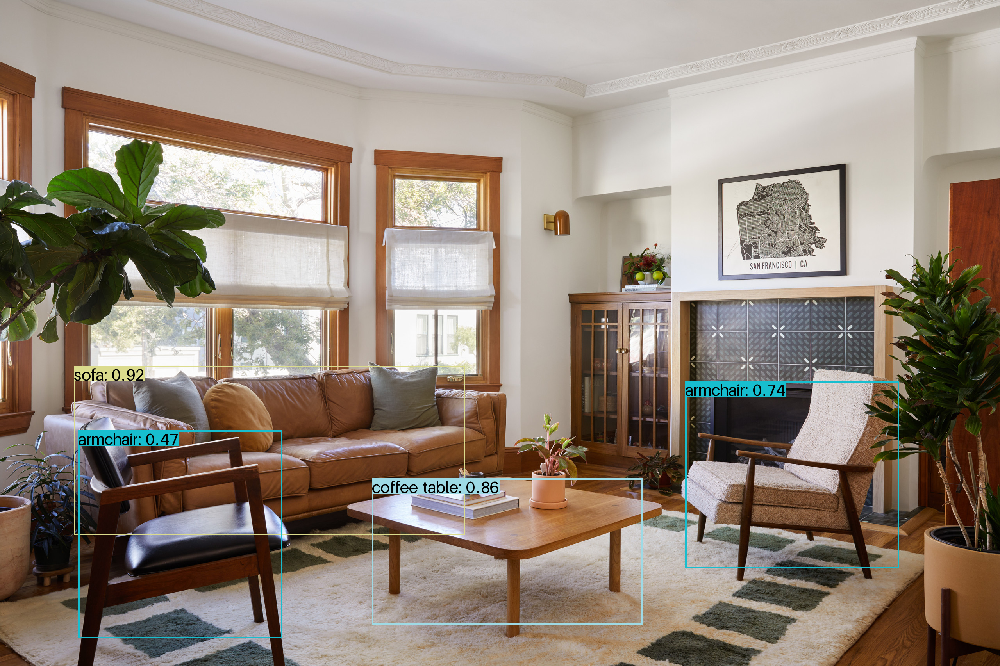

In [29]:
output_path = detect_furniture_in_image(image_path)
viz = load_image("result.png")
out_img = PIL.Image.fromarray(viz)
out_img

# Converting entire process into a function
Now we shall create a functionality to take image url as an input and detect the defined categories of sofa, armchair and coffee table

In [30]:
from vision_agent.tools import load_image
import PIL.Image

def detect_objects_from_image_url(image_url):
    img_np = load_image(image_url)
    img_pil = PIL.Image.fromarray(img_np)
    image_path = "test_image.png"
    img_pil.save(image_path)
    output_path = detect_furniture_in_image(image_path)
    viz = load_image("result.png")
    out_img = PIL.Image.fromarray(viz)
    return out_img


## Test the functionality

Detected furniture items:
sofa: confidence=0.75, bbox=[0.395, 0.353, 0.996, 0.781]
sofa: confidence=0.75, bbox=[0.03, 0.397, 0.23, 0.653]
coffee table: confidence=0.74, bbox=[0.075, 0.596, 0.521, 0.907]
coffee table: confidence=0.63, bbox=[0.066, 0.759, 0.516, 0.934]
coffee table: confidence=0.48, bbox=[0.266, 0.447, 0.359, 0.508]


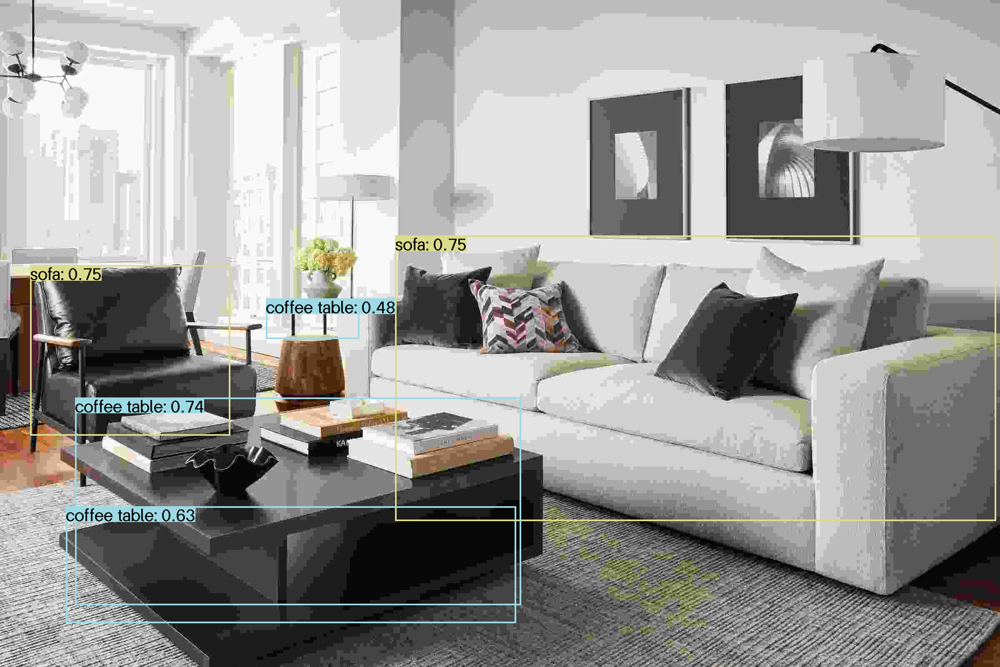

In [31]:
test_image_url = 'https://rnb.scene7.com/is/image/roomandboard/baylor_488382_24e?size=2400,2400&scl=1&qlt=5'
out_img = detect_objects_from_image_url(test_image_url)
out_img

The result looks good. Let's try another image.

## Conclusion

In this notebook, we demonstrated how to use VisionAgent to generate code that performs multi object detection